# (14) OOD: Kyoto,MNIST -> DAVIS

host = ```any```, device = ```cuda:0```

**Motivation**:  <br>


In [1]:
# HIDE CODE


project_name = '_TemporalSC'


import os, sys
from IPython.display import display

# tmp & extras dir
git_dir = os.path.join(os.environ['HOME'], 'Dropbox/git')
extras_dir = os.path.join(git_dir, 'jb-progress-2025/_extras')
fig_base_dir = os.path.join(git_dir, 'jb-progress-2025/figs')
tmp_dir = os.path.join(git_dir, 'jb-progress-2025/tmp')

# GitHub
sys.path.insert(0, os.path.join(git_dir, project_name))
from figures.convergence import plot_convergence
from main.config_defaults import default_configs
from figures.fighelper import *
from main.train import *

# warnings, tqdm, & style
warnings.filterwarnings('ignore', category=DeprecationWarning)
warnings.filterwarnings('ignore', category=FutureWarning)
warnings.filterwarnings('ignore', category=UserWarning)
from rich.jupyter import print
%matplotlib inline
set_style()

In [2]:
device_idx = 0
device = f'cuda:{device_idx}'

print(f"device: {device}  ———  host: {os.uname().nodename}")

device: cuda:0  ———  host: chewie

## Setup

In [3]:
from analysis.final import get_root_path
from main.datafeeder import CropVidFeeder
from base.helper import filter_boundaries
from utils.animation import show_movie, animate_recons


anim_dir = pjoin(tmp_dir, 'animations/ood')
os.makedirs(anim_dir, exist_ok=True)

print(sorted(os.listdir(anim_dir)))

[
    'Kyoto-wht+translate-to-CelebA138_kms-(512,56,3)_fwd-(1,3)_speed-2.0.mp4',
    'MNIST+rotate-to-CelebA100_kms-(192,41,3)_fwd-(3,7)_dtheta-4.0.mp4',
    'MNIST+rotate-to-CelebA138_cherrypicked_kms-(192,58,3)_fwd-(3,7)_dtheta-4.0.mp4',
    'MNIST+rotate-to-CelebA138_ids-{256,185,4,6,328,115,53,153,318,255}_kms-(512,58,3)_fwd-(1,3)_dtheta-4.0.mp4',
    'MNIST+rotate-to-CelebA138_kms-(192,58,3)_fwd-(3,0)_dtheta-4.0.mp4',
    'MNIST+rotate-to-CelebA138_kms-(192,58,3)_fwd-(3,5)_dtheta-4.0.mp4',
    'MNIST+rotate-to-CelebA138_kms-(192,58,3)_fwd-(3,7)_dtheta-4.0.mp4',
    'MNIST+rotate-to-ImageNet32_kms-(192,8,3)_fwd-(3,7)_dtheta-15.mp4',
    'MNIST+rotate-to-ImageNet32_kms-(192,8,3)_fwd-(3,7)_dtheta-4.0.mp4',
    'MNIST+rotate-to-ImageNet32_kms-(192,8,3)_fwd-(3,7)_dtheta-4.0_FULL.mp4',
    'MNIST+rotate-to-ImageNet32_kms-(192,8,3)_fwd-(3,7)_dtheta=2.0.mp4',
    'MNIST+rotate-to-ImageNet32_kms-(192,8,3)_fwd-(3,7)_dtheta=4.0.mp4',
    'all_samples'
]

## Load DAVIS dataset

In [4]:
davis_dir = '/home/hadi/Datasets/DAVIS/processed'
print(sorted(os.listdir(davis_dir)))

['DAVIS_bnw.npy', 'DAVIS_color.npy', 'DAVIS_mask.npy', 'DAVIS_wht.npy']

In [5]:
davis_mask = np.load(pjoin(davis_dir, 'DAVIS_mask.npy'), allow_pickle=True).item()
davis_bnw = np.load(pjoin(davis_dir, 'DAVIS_bnw.npy'), allow_pickle=True).item()
davis_wht = np.load(pjoin(davis_dir, 'DAVIS_wht.npy'), allow_pickle=True).item()

### Show video

In [6]:
feeder = CropVidFeeder(
    x=davis_wht['bear'],
    crop_size=128,
    batch_size=200,
    device=device,
)
print(feeder)

CropVidFeeder(batch_size=200, iters_per_epoch=1, max_epochs=100, device=cuda:0, seq_len=82)

In [7]:
_ = feeder.get_batch_data(0)

In [8]:
cropped_vid = []
for t in range(feeder.seq_len):
    x_batch, _ = feeder.step()
    cropped_vid.append(tonp(x_batch))
cropped_vid = np.stack(cropped_vid, axis=1)
cropped_vid.shape

(200, 82, 1, 128, 128)

### show movie

In [9]:
show_movie(cropped_vid[0].squeeze())

## Selected models

In [10]:
fit_kyoto = (
    'poisson_<ngd|lin>_Kyoto-wht+translate_t-(16,8,4)_b-2_kms-(512,9,3)_fwd-(3,7)_recon-mse' +
    '_no-balance-stages_mach-0_(2025_09_11,12:28)'
)
fit_mnist = (
    'poisson_<ngd|lin>_MNIST+rotate_t-(16,8,4)_b-1_kms-(256,8,3)_fwd-(3,7)_recon-mse' +
    '_no-balance-stages_chewie-0_(2025_09_11,12:21)'
)
fits = {'Kyoto': fit_kyoto, 'MNIST': fit_mnist}

## Kyoto

In [11]:
tr, meta = load_model_lite(pjoin(get_root_path(), fits['Kyoto']), device=device)
tr.print()

poisson_Kyoto-wht+translate_t-(16,8,4)_b-2_kms-(512,9,3)_fwd-(3,7)_<ngd|lin>
b100-ep300-lr(0.0005)_temp(0.05)_gr(500)_(2025_09_11,12:28)

In [12]:
crop_size = 128

df = tr.model.update_model_dims(crop_size)

print(df)
print(tr.model.layer.dec)

mode  computed       parameter  value
0  deconv      True      input_size     41
1  deconv     False     output_size    128
2  deconv     False     kernel_size      8
3  deconv     False          stride      3
4  deconv     False         padding      0
5  deconv     False  output_padding      0

ConvDictionary(in_channels=512, out_channels=1, kernel_size=8, stride=3)

In [13]:
feeder = CropVidFeeder(
    x=davis_wht['bear'],
    crop_size=crop_size,
    batch_size=200,
    device=device,
)
print(feeder)

CropVidFeeder(batch_size=200, iters_per_epoch=1, max_epochs=100, device=cuda:0, seq_len=82)

In [14]:
output = tr.xtract_ftr(feeder, t_total=feeder.seq_len, n_data_batches=1)

batch #1, (t = 82): 100%|███████████████| 1/1 [00:29<00:00, 29.48s/it]


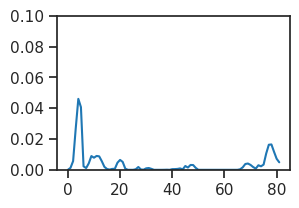

In [16]:
plot(output['r2'])
plt.ylim((0, 0.1));

### Slow down?

In [26]:
x = torch.from_numpy(davis_wht['bear']).to(device=device)

slow_factor = 3

x_slow = F.interpolate(
    x.permute(1, 0, 2, 3).unsqueeze(0),
    size=(x.shape[0] * slow_factor, x.shape[2], x.shape[3]),
    mode="trilinear",
    align_corners=False
)

x_slow = x_slow.squeeze(0).permute(1, 0, 2, 3).contiguous()
x_slow.shape

torch.Size([246, 1, 480, 854])

In [27]:
feeder_slow = CropVidFeeder(
    x=x_slow,
    crop_size=crop_size,
    batch_size=100,
    device=device,
)
print(feeder_slow)

CropVidFeeder(batch_size=100, iters_per_epoch=1, max_epochs=100, device=cuda:0, seq_len=246)

In [28]:
output_slow = tr.xtract_ftr(feeder_slow, t_total=feeder_slow.seq_len, n_data_batches=1)

batch #1, (t = 246): 100%|██████████████| 1/1 [00:45<00:00, 45.62s/it]


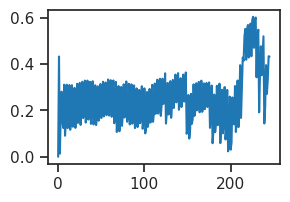

In [29]:
plot(output_slow['pred_r2']);

In [30]:
output_slow['r2'][-1], output_slow['pred_r2'][-1]

(0.49319258, 0.4326551)

In [31]:
cropped_vid = []
for t in range(feeder_slow.seq_len):
    x_batch, _ = feeder_slow.step()
    cropped_vid.append(tonp(x_batch))
cropped_vid = np.stack(cropped_vid, axis=1)
cropped_vid.shape

(100, 246, 1, 128, 128)

In [32]:
cropped_vid.mean(), cropped_vid.std()

(2.0094078e-09, 0.4000005)

In [33]:
show_movie(cropped_vid[0].squeeze())